# Tracking Natural Disasters from Space:
## An Exploratory Data Analysis of NASA EONET Events and FIRMS Fire Detections

## I. Introduction
This project explores global patterns in natural hazard events using historical satellite-based data. We use the NASA [Earth Observatory Natural Event Tracker (EONET)](http://eonet.gsfc.nasa.gov)  API as the primary data source to analyze wildfire and volcanic events, examining their geographic distribution, magnitude, and temporal patterns. Event locations are visualized on world maps to identify spatial clusters, and monthly averages are calculated to study seasonal trends across hemispheres.

To enrich the wildfire analysis, we incorporate NASA [Fire Information for Resource Management System (FIRMS)](http://firms.modaps.eosdis.nasa.gov/) data, which provides satellite fire detections including fire radiative power (FRP) and day–night indicators. Using these datasets, we investigate regional wildfire activity, intensity differences, and compare patterns between wildfires and volcanic eruptions across the globe.

## II. Main Data Analysis

### 1. Get ready the main dataset: EONET

For the main data, we obtain natural hazard event data using the NASA [EONET API](https://eonet.gsfc.nasa.gov/docs/v2.1), which provides continuously updated information on global natural events. The returned data contains a list of events, each with several key attributes. By inspecting the dataset, we get 8 variables from the raw data and split them into 17 features for further analysis, for example:


* **id**：unique identifier
* **title**：event name
* **categories**：type of natural hazard such as wildfire or volcano
* **geometry**：featured by **coordinates** and **timestamps**
* **magnitude**: intensity of the events featured by **value and unit**


   ...


Among these variables, the **event categories serves as the primary target variable**, as the project focuses on identifying patterns in specific hazard types—particularly wildfires and volcanic eruptions—across geographic locations, time, and intensity indicators such as magnitude.

In [62]:
import requests
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### 1.1 Obtain Data from NASA-EONET

In [63]:
EONET_api = 'Ck2gpgJCgbBV3LeSjxtcJhQVNzBFGArmAnMO9VsO'
EONET_url = "https://eonet.gsfc.nasa.gov/api/v3/events"

response = requests.get(EONET_url)
eonet_data = response.json()


### 1.2 Identify and narrow down the Target

This project aim to study the effect of different variables like location or time on certain type of natrual disaster,which means the **Target** of this study based on the raw data is **categories**.

In [64]:
# check what are the useful keys from the source
all_keys = set()
for event in eonet_data["events"]:
    all_keys.update(event.keys())

print("All event-level keys found:")
print(sorted(all_keys))

All event-level keys found:
['categories', 'closed', 'description', 'geometry', 'id', 'link', 'sources', 'title']


Due to **limited sample size** for Volcanoes and Sea and Lake Ice, this project mainly focus on **Wildfires** as Target.

In [65]:
events_df = pd.DataFrame(eonet_data["events"])

categories_df = events_df.explode("categories")
categories_only = pd.json_normalize(categories_df["categories"])

# 1. check events type
unique_disaster_types = pd.DataFrame(
    categories_only["title"].drop_duplicates().reset_index(drop=True),
    columns=["disaster_type"]
)

print(unique_disaster_types)

# 2. count for each events
counts = categories_only["title"].value_counts().reset_index()
counts.columns = ["disaster_type", "count"]

print(counts)

Empty DataFrame
Columns: [disaster_type]
Index: []
      disaster_type  count
0         Wildfires   6264
1         Volcanoes     44
2  Sea and Lake Ice     35
3     Severe Storms      2


### 1.3 Build up Main Data Frame

In [66]:
df = pd.DataFrame(eonet_data)

In [67]:
# Flatten EONET events into rows
rows = []
events_df = eonet_data["events"]

for event in events_df:
    event_id = event.get("id")
    title = event.get("title")
    closed = event.get("closed")
    categories = event.get("categories", [])
    sources = event.get("sources", [])
    geometry_list = event.get("geometry", [])

    for g in geometry_list:
        row = {
            "event_id": event_id,
            "title": title,
            "closed": closed,
            "category_id": categories[0]["id"] if categories else None,
            "category_title": categories[0]["title"] if categories else None,
            "source_count": len(sources),
            "geometry_date": g.get("date"),
            "geometry_type": g.get("type"),
            "magnitude_value": g.get("magnitudeValue"),
            "magnitude_unit": g.get("magnitudeUnit"),
            "magnitude_description": g.get("magnitudeDescription"),
            "coordinates": g.get("coordinates")

        }
        rows.append(row)

df = pd.DataFrame(rows)

# split coordination into longitude and latitude
df["longitude"] = df["coordinates"].str[0]
df["latitude"] = df["coordinates"].str[1]

# transform data to numerical type using datetime
df["geometry_date"] = pd.to_datetime(df["geometry_date"])
df["year"] = df["geometry_date"].dt.year
df["month"] = df["geometry_date"].dt.month
df["day"] = df["geometry_date"].dt.day
df["hour_utc"] = df["geometry_date"].dt.hour

# Approximate local time from longitude
# 15 degrees longitude ~= 1 hour offset
df["utc_offset_approx"] = np.round(df["longitude"] / 15)

# Local hour in 0-23 range
df["hour_local_approx"] = (df["hour_utc"] + df["utc_offset_approx"]) % 24

# Create approximate daynight variable
df["daynight"] = np.where(
    df["hour_local_approx"].between(6, 17),
    "D",
    "N"
)

df.head()
df

,event_id,title,closed,category_id,category_title,source_count,geometry_date,geometry_type,magnitude_value,magnitude_unit,...,coordinates,longitude,latitude,year,month,day,hour_utc,utc_offset_approx,hour_local_approx,daynight
0,EONET_18750,"90 Degrees Wildfire, Latimer, Oklahoma",None,wildfires,Wildfires,1,2026-03-24 02:44:00+00:00,Point,600.0,acres,...,"[-95.2988889, 35.0336111]",-95.298889,35.033611,2026,3,24,2,-6.0,20.0,N
1,EONET_18758,"Luna Branch Wildfire, Adair, Oklahoma",None,wildfires,Wildfires,1,2026-03-23 19:31:00+00:00,Point,1250.0,acres,...,"[-94.7343333, 36.1103333]",-94.734333,36.110333,2026,3,23,19,-6.0,13.0,D
2,EONET_18768,"Oxbow Wildfire, Okfuskee, Oklahoma",None,wildfires,Wildfires,1,2026-03-23 17:32:00+00:00,Point,2068.0,acres,...,"[-96.4380556, 35.5188889]",-96.438056,35.518889,2026,3,23,17,-6.0,11.0,D
3,EONET_18772,"Polk Treat Mountain Wildfire, Floyd, Georgia",None,wildfires,Wildfires,1,2026-03-23 17:17:00+00:00,Point,500.0,acres,...,"[-85.4469444, 34.2797222]",-85.446944,34.279722,2026,3,23,17,-6.0,11.0,D
4,EONET_18780,"MIDDLE CREEK Wildfire, Hughes, Oklahoma",None,wildfires,Wildfires,1,2026-03-23 14:21:00+00:00,Point,2026.0,acres,...,"[-95.987222, 35.207222]",-95.987222,35.207222,2026,3,23,14,-6.0,8.0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7044,EONET_2878,Iceberg B09B,None,seaLakeIce,Sea and Lake Ice,2,2011-08-30 00:00:00+00:00,Point,NaN,None,...,"[143.3638, -66.366]",143.363800,-66.366000,2011,8,30,0,10.0,10.0,D
7045,EONET_2878,Iceberg B09B,None,seaLakeIce,Sea and Lake Ice,2,2013-04-08 00:00:00+00:00,Point,NaN,None,...,"[142.6649, -66.7354]",142.664900,-66.735400,2013,4,8,0,10.0,10.0,D
7046,EONET_2878,Iceberg B09B,None,seaLakeIce,Sea and Lake Ice,2,2018-01-12 00:00:00+00:00,Point,NaN,None,...,"[143.39, -66.37]",143.390000,-66.370000,2018,1,12,0,10.0,10.0,D
7047,EONET_2997,Iceberg C21B,None,seaLakeIce,Sea and Lake Ice,2,2011-08-30 00:00:00+00:00,Point,NaN,None,...,"[96.18, -64.9955]",96.180000,-64.995500,2011,8,30,0,6.0,6.0,D


### 2. Analysis of main data


### 2.1 Wildfire Spatial Distribution (Visualize Target vs. coordination)
The densest concentrations appear in **North America** (especially the United States and western Canada), **the Amazon basin** in South America, **central and southern Africa**, **eastern Siberia**, and **Australia**.

The clustering also highlights several global wildfire “hotspots,” indicating that wildfire risk is **concentrated in specific ecological regions** rather than evenly distributed worldwide.

Overall, the visualization suggests that wildfire activity is strongly associated with **vegetation availability and regional climate patterns**, particularly in tropical forests, savannas, and temperate forest zones.

In [68]:
import folium as fm

wildfire_data = df[df["category_title"] == "Wildfires"].copy()
wildfire_data = wildfire_data.dropna(subset=["latitude", "longitude"])

wildfire_world_map = fm.Map(location=[20, 0], zoom_start=2)

for row_index, wildfire_record in wildfire_data.iterrows():
    fm.CircleMarker(
        location=[wildfire_record["latitude"], wildfire_record["longitude"]],
        radius=1,
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"Event: {wildfire_record['title']}<br>"
            f"Date: {wildfire_record['geometry_date']}<br>"
            f"Magnitude: {wildfire_record['magnitude_value']} {wildfire_record['magnitude_unit']}"
        )
    ).add_to(wildfire_world_map)

wildfire_world_map

### 2.2 Wildfire Count by Continent (Target vs. Continent)
The highest wildfire event counts appear in **North America**, followed by **Africa**, with substantial activity also recorded in **South America** and **Oceania**. In contrast, **Asia** shows a lower count, while **Europe** contains comparatively few wildfire events in this dataset.

The distribution highlights several broad continental wildfire “hotspots,” suggesting that wildfire activity is **concentrated in specific world regions** rather than evenly distributed across continents. This pattern is consistent with the spatial clustering observed in heavily forested, savanna, and dryland regions.

Overall, the table suggests that wildfire occurrence is strongly shaped by **regional environmental conditions** as well as the **geographic coverage of the NASA dataset.**

**Notes:** Since there is no formal continent classification directly defined by latitude and longitude, this study assigns continents using **approximate latitude–longitude** bounding boxes. Records outside these predefined geographic ranges are labeled as **Other / Unclassified.**

In [69]:
wildfire_data = df[df["category_title"] == "Wildfires"].copy()
wildfire_data = wildfire_data.dropna(subset=["latitude", "longitude"])

#We approximate continent bounding boxes
#these are simplified geographic ranges for analysis, not official legal boundaries
continent_bounds = { "North America": {
        "min_lat": 7,
        "max_lat": 83,
        "min_lon": -170,
        "max_lon": -52
    },
    "South America": {
        "min_lat": -56,
        "max_lat": 13,
        "min_lon": -82,
        "max_lon": -34
    },
    "Europe": {
        "min_lat": 35,
        "max_lat": 72,
        "min_lon": -25,
        "max_lon": 60
    },
    "Africa": {
        "min_lat": -35,
        "max_lat": 37,
        "min_lon": -18,
        "max_lon": 52
    },
    "Asia": {
        "min_lat": 1,
        "max_lat": 81,
        "min_lon": 26,
        "max_lon": 180
    },
    "Oceania": {
        "min_lat": -50,
        "max_lat": 0,
        "min_lon": 110,
        "max_lon": 180
    },
    "Antarctica": {
        "min_lat": -90,
        "max_lat": -60,
        "min_lon": -180,
        "max_lon": 180
    }
}

# then, assign continent based on latitude and longitude
def classify_continent(latitude, longitude):
    for continent_name, bounds in continent_bounds.items():
        if (
            bounds["min_lat"] <= latitude <= bounds["max_lat"] and
            bounds["min_lon"] <= longitude <= bounds["max_lon"]
        ):
            return continent_name
    return "Other / Unclassified"

wildfire_data["continent"] = wildfire_data.apply(
    lambda row: classify_continent(row["latitude"], row["longitude"]),
    axis=1
)

wildfire_count_by_continent = (
    wildfire_data["continent"]
    .value_counts()
    .rename_axis("continent")
    .reset_index(name="wildfire_event_count")
)

continent_order = [
    "North America",
    "South America",
    "Europe",
    "Africa",
    "Asia",
    "Oceania",
    "Antarctica",
    "Other / Unclassified"
]

wildfire_count_by_continent["continent"] = pd.Categorical(
    wildfire_count_by_continent["continent"],
    categories=continent_order,
    ordered=True
)

wildfire_count_by_continent = wildfire_count_by_continent.sort_values("continent")

print(wildfire_count_by_continent)

       continent  wildfire_event_count
0  North America                  2692
2  South America                   847
5         Europe                    25
1         Africa                  1585
4           Asia                   424
3        Oceania                   691


/tmp/ipykernel_2738/1044900572.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


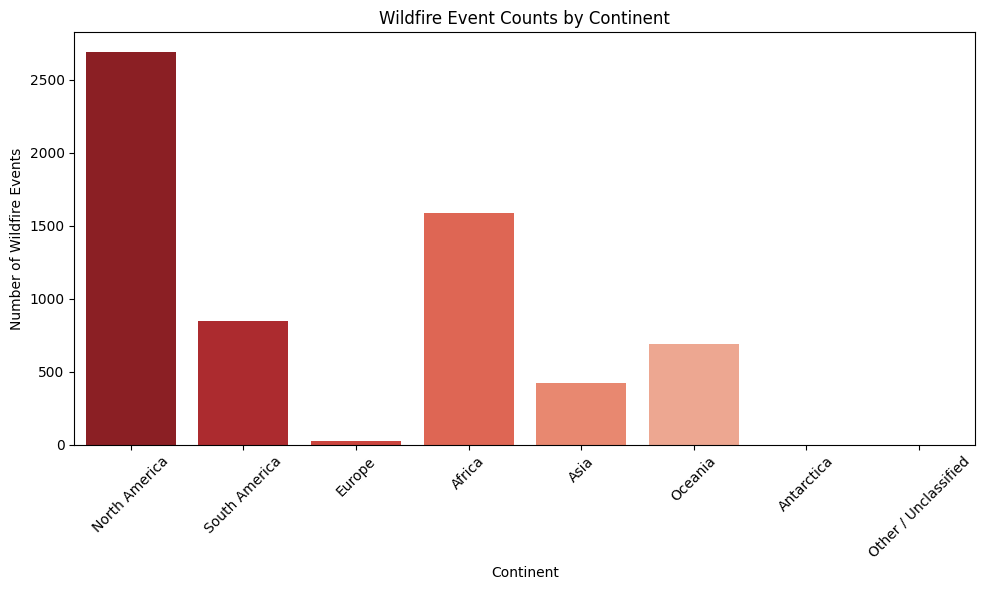

In [70]:
plt.figure(figsize=(10,6))

sns.barplot(
    data = wildfire_count_by_continent,
    x="continent",
    y="wildfire_event_count",
    palette="Reds_r"
)

plt.title("Wildfire Event Counts by Continent")
plt.xlabel("Continent")
plt.ylabel("Number of Wildfire Events")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

### 2.3 Wildfire Magnitude Distribution (Target vs. Magnitude)

When examining wildfire events with **available magnitude data**, the majority of usable observations are concentrated in the **United States**, which largely reflects the underlying data sources that report wildfire sizes in acres. The map shows that most wildfire events with recorded magnitudes cluster across the **western and southern United States**, with particularly dense activity along the **West Coast and interior regions**.

Overall, the visualization highlights the **regional variation** in wildfire size across the United States.

In [71]:
import branca.colormap as cm
import numpy as np

# focus on wildfire events with full information
wildfire_magnitude_data = df[
    (df["category_title"] == "Wildfires") &
    (df["magnitude_value"].notna()) &
    (df["magnitude_unit"] == "acres")
].copy()


wildfire_magnitude_data = wildfire_magnitude_data.dropna(
    subset=["latitude", "longitude", "magnitude_value"]
)

# creater color scale based on a log scale of magnitude value
wildfire_magnitude_data["log_magnitude"] = np.log10(wildfire_magnitude_data["magnitude_value"])

magnitude_color_scale = cm.linear.YlOrRd_09.scale(
    wildfire_magnitude_data["log_magnitude"].min(),
    wildfire_magnitude_data["log_magnitude"].max()
)
magnitude_color_scale.caption = "Wildfire Magnitude (acres)"

wildfire_magnitude_map = fm.Map(location=[39.5, -98.35], zoom_start=3) # auto-centered the map at the US

for row_index, wildfire_record in wildfire_magnitude_data.iterrows():
    point_color = magnitude_color_scale(wildfire_record["magnitude_value"])

    fm.CircleMarker(
        location=[wildfire_record["latitude"], wildfire_record["longitude"]],
        radius=0.5,
        color=point_color,
        fill=True,
        fill_color=point_color,
        fill_opacity=0.75,
        popup=(
            f"Event: {wildfire_record['title']}<br>"
            f"Date: {wildfire_record['geometry_date']}<br>"
            f"Magnitude: {wildfire_record['magnitude_value']} {wildfire_record['magnitude_unit']}"
        )
    ).add_to(wildfire_magnitude_map)

# adding legend
magnitude_color_scale.add_to(wildfire_magnitude_map)

wildfire_magnitude_map

### 2.4 Monthly Wildfire Seasonality by Hemisphere (Target vs Time & Hemisphere)

Over the past several full years, wildfire activity shows a clear **seasonal pattern** that differs across hemispheres. In the **Northern Hemisphere**, wildfire events tend to **rise during the middle of the year and peak in the warmer months**, while the **Southern Hemisphere** shows relatively higher activity later in the calendar year, reflecting its **opposite seasonal cycle**. This contrast suggests that wildfire occurrence is strongly influenced by climate and seasonal dryness rather than being evenly distributed throughout the year.

Overall, the comparison highlights that global wildfire patterns are **seasonal**, but the timing of peak activity **reverses between the two hemispheres**.

In [72]:
number_of_years = 5

# drop rows missing info and remove timezone
wildfire_data = wildfire_data.dropna(subset=["geometry_date", "latitude"])
wildfire_data["geometry_date"] = wildfire_data["geometry_date"].dt.tz_localize(None)

# determine the last n full years
current_year = pd.Timestamp.today().year
end_year = current_year - 1
start_year = end_year - number_of_years + 1

wildfire_data = wildfire_data[
    (wildfire_data["geometry_date"].dt.year >= start_year) &
    (wildfire_data["geometry_date"].dt.year <= end_year)
].copy()

# group by north and south hemispheres
wildfire_data["hemisphere"] = None
wildfire_data.loc[wildfire_data["latitude"] > 0, "hemisphere"] = "Northern Hemisphere"
wildfire_data.loc[wildfire_data["latitude"] < 0, "hemisphere"] = "Southern Hemisphere"

# count wildfire by year, month, hemisphere
monthly_wildfire_count = (
    wildfire_data
    .groupby(["year", "month", "hemisphere"])
    .size()
    .reset_index(name="wildfire_count")
)

# create combinations
all_years = list(range(start_year, end_year + 1))
all_months = list(range(1, 13))
all_hemispheres = ["Northern Hemisphere", "Southern Hemisphere"]

full_index = pd.MultiIndex.from_product(
    [all_years, all_months, all_hemispheres],
    names=["year", "month", "hemisphere"]
)
monthly_wildfire_count = (
    monthly_wildfire_count
    .set_index(["year", "month", "hemisphere"])
    .reindex(full_index, fill_value=0)
    .reset_index()
)

# compute monthly average across selected years
monthly_average_wildfire = (
    monthly_wildfire_count
    .groupby(["month", "hemisphere"])["wildfire_count"]
    .mean()
    .reset_index(name="average_wildfire_count")
)

# add readable month names
monthly_average_wildfire["month_name"] = pd.to_datetime(
    monthly_average_wildfire["month"], format="%m"
).dt.strftime("%b")


monthly_average_wildfire_table = (
    monthly_average_wildfire
    .pivot(index=["month", "month_name"], columns="hemisphere", values="average_wildfire_count")
    .reset_index()
    .sort_values("month")
)

print(monthly_average_wildfire_table)

hemisphere  month month_name  Northern Hemisphere  Southern Hemisphere
0               1        Jan                 45.0                 14.0
1               2        Feb                 32.8                  5.2
2               3        Mar                 62.4                  2.2
3               4        Apr                 42.8                  2.2
4               5        May                 27.6                  0.4
5               6        Jun                105.6                 25.8
6               7        Jul                101.4                106.8
7               8        Aug                 67.6                180.0
8               9        Sep                 29.6                116.4
9              10        Oct                 16.0                 54.2
10             11        Nov                 17.4                 21.4
11             12        Dec                 42.6                  7.6


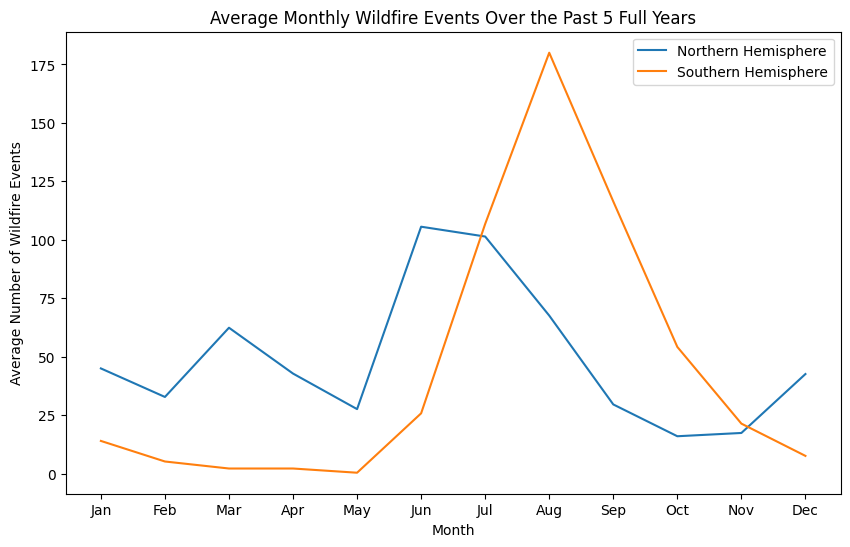

In [73]:
# make sure the trend follow time order
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

plot_data = monthly_average_wildfire_table.copy()
plot_data["month_name"] = pd.Categorical(
    plot_data["month_name"],
    categories=month_order,
    ordered=True
)
plot_data = plot_data.sort_values("month_name")

plt.figure(figsize=(10, 6))

# plot the trend of northern hemisphere
plt.plot(
    plot_data["month_name"],
    plot_data["Northern Hemisphere"],
    label="Northern Hemisphere"
)

# plot the trend of southern hemisphere
plt.plot(
    plot_data["month_name"],
    plot_data["Southern Hemisphere"],
    label="Southern Hemisphere"
)

plt.title(f"Average Monthly Wildfire Events Over the Past {number_of_years} Full Years")
plt.xlabel("Month")
plt.ylabel("Average Number of Wildfire Events")
plt.legend()
plt.show()

## III. Secondary Analysis: Using FIRMS Wildfire to qualify EONET results

The [VIIRS_SNPP_NRT](https://firms.modaps.eosdis.nasa.gov/api/) dataset from FIRMS provides near–real-time satellite detections of active fires collected by the VIIRS sensor aboard the Suomi NPP satellite, including information on fire **location**, detection **day/night time**, and **fire radiative power (FRP)**, which measures fire **intensity**.

Because EONET captures only large, discrete wildfire events while FIRMS records all fire detections (including small and short-lived fires), **EONET** data tends to show more **concentrated patterns across states and seasonal spikes by month**, whereas **FIRMS** produces **smoother, more widespread distributions** across both state-level and monthly analyses.

In [74]:
MAP_KEY = "2ddd50e0dd502912a6a65f775494dbd5"

source = "VIIRS_SNPP_NRT"
bbox = "-125,24,-66,50"
days = 5

firms_url = f"https://firms.modaps.eosdis.nasa.gov/api/area/csv/{MAP_KEY}/{source}/{bbox}/{days}"

firms_df = pd.read_csv(firms_url)

firms_df["acq_date"] = pd.to_datetime(firms_df["acq_date"])
firms_df["year"] = firms_df["acq_date"].dt.year
firms_df["month"] = firms_df["acq_date"].dt.month

firms_df.head()

,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,daynight,year,month
0,41.36595,-84.92548,329.74,0.57,0.43,2026-03-23,716,N,VIIRS,n,2.0NRT,274.00,4.80,N,2026,3
1,42.80199,-80.10303,301.65,0.40,0.37,2026-03-23,716,N,VIIRS,n,2.0NRT,272.21,0.74,N,2026,3
2,42.80468,-80.09724,301.81,0.40,0.37,2026-03-23,716,N,VIIRS,n,2.0NRT,273.96,0.85,N,2026,3
3,42.80536,-80.10217,297.10,0.40,0.37,2026-03-23,716,N,VIIRS,n,2.0NRT,272.45,0.85,N,2026,3
4,42.80805,-80.09638,296.78,0.40,0.37,2026-03-23,716,N,VIIRS,n,2.0NRT,274.53,0.85,N,2026,3


### 1.  Does wildfire happends more at day or at night?


### 1.1 Finding  based on EONET
Wildfire events in the EONET dataset occur **more frequently during the daytime (61%)** than at night (39%), suggesting that recorded wildfire activity is more commonly associated with daytime conditions or daytime satellite detection.

  daynight  wildfire_event_count
0        N                  3858
1        D                  2406


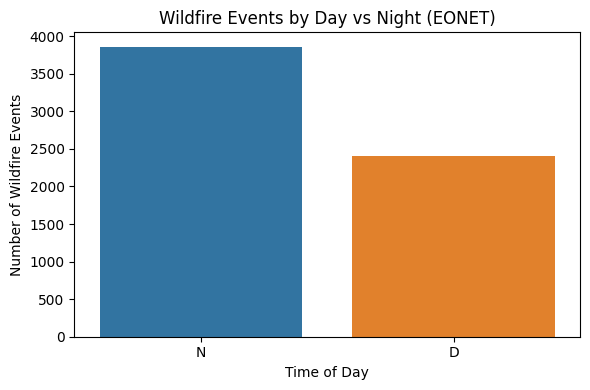

  daynight  wildfire_event_count  percentage
0        N                  3858   61.590038
1        D                  2406   38.409962


In [75]:
# Keep only wildfire events
wildfire_daynight = df[df["category_title"] == "Wildfires"].copy()

# Drop missing daynight values
wildfire_daynight = wildfire_daynight.dropna(subset=["daynight"])

# Count events by day/night
daynight_counts = (
    wildfire_daynight["daynight"]
    .value_counts()
    .rename_axis("daynight")
    .reset_index(name="wildfire_event_count")
)

print(daynight_counts)

# plotting the result
plt.figure(figsize=(6,4))

sns.barplot(
    data=daynight_counts,
    x="daynight",
    y="wildfire_event_count",
    hue="daynight",
    legend=False
)

plt.title("Wildfire Events by Day vs Night (EONET)")
plt.xlabel("Time of Day")
plt.ylabel("Number of Wildfire Events")

plt.tight_layout()
plt.show()

# calculating percentage
daynight_counts["percentage"] = (
    daynight_counts["wildfire_event_count"] /
    daynight_counts["wildfire_event_count"].sum()
) * 100

print(daynight_counts)

### 1.2 Finding based on FIRMS

The FIRMS data for the selected wildfire region shows a strong imbalance between daytime and nighttime fire detections, with approximately **62%** of detections occurring **during the day** and only **38% at night**. This suggests that **wildfire activity in this area is much more frequently detected under daytime conditions**. However, this pattern may reflect not only actual fire behavior but also differences in satellite detection capabilities, as daytime observations can capture larger or more visible fires more effectively. Overall, within this localized time window and region, the results indicate a clear dominance of daytime wildfire detections, align with the earlier finding based on EONET data.

*Note: Since the fire spots offered by FIRMS are not necessaryly wildfire, the study used the location information from EONET to captured event form FIRMS to align the event type.

In [76]:
# Select a wildfire event and creates a geographic bounding box around it.
# This will be used to request nearby fire detections from the FIRMS satellite data API.
selected_event = wildfire_data.iloc[0]

center_latitude = selected_event["latitude"]
center_longitude = selected_event["longitude"]

min_longitude = center_longitude - 1
max_longitude = center_longitude + 1
min_latitude = center_latitude - 1
max_latitude = center_latitude + 1

area_coordinates = f"{min_longitude},{min_latitude},{max_longitude},{max_latitude}"

day_range = 5 # this range is limited by NASA, and can exclude seaonal effect
firms_area_url = (
    f"https://firms.modaps.eosdis.nasa.gov/api/area/csv/"
    f"{MAP_KEY}/{source}/{area_coordinates}/{day_range}"
)

firms_fire_data = pd.read_csv(firms_area_url)

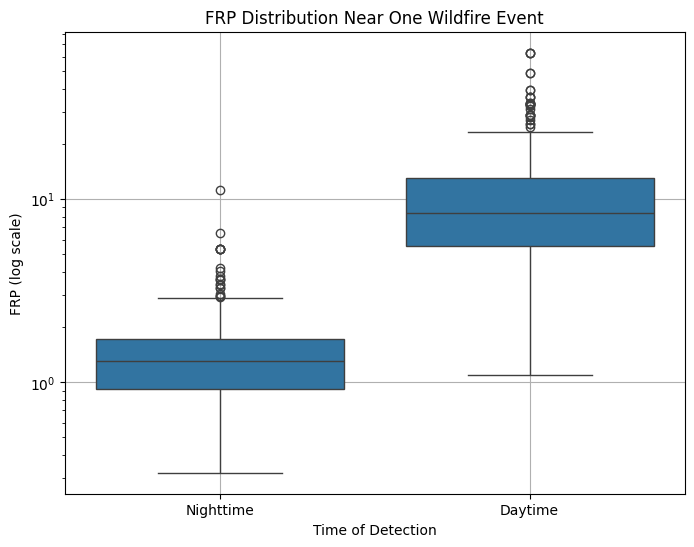

  daynight_label  firms_detection_count  percentage
0        Daytime                    461   61.962366
1      Nighttime                    283   38.037634


In [77]:
wildfire_firms_data = firms_fire_data[["frp", "daynight"]].dropna().copy()
wildfire_firms_data = wildfire_firms_data[
    wildfire_firms_data["daynight"].isin(["D", "N"])
].copy()

wildfire_firms_data["daynight_label"] = wildfire_firms_data["daynight"].map({
    "D": "Daytime",
    "N": "Nighttime"
})

# Count FIRMS detections by day/night
firms_daynight_counts = (
    wildfire_firms_data["daynight_label"]
    .value_counts()
    .rename_axis("daynight_label")
    .reset_index(name="firms_detection_count")
)

# plot the results
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=wildfire_firms_data,
    x="daynight_label",
    y="frp"
)

plt.yscale("log")

plt.xlabel("Time of Detection")
plt.ylabel("FRP (log scale)")
plt.title("FRP Distribution Near One Wildfire Event")
plt.grid(True)

plt.show()

# Calculate percentages
firms_daynight_counts["percentage"] = (
    firms_daynight_counts["firms_detection_count"] /
    firms_daynight_counts["firms_detection_count"].sum()
) * 100

print(firms_daynight_counts)

### 2. How does the Fire Power Radiation vary insede United States?

The availability of wildfire magnitude data in the EONET dataset is highly **uneven across regions**, with most magnitude measurements concentrated in North America. In responsd to this data feature, the study zoom in the see the fire insensity variation inside the US comparing using **nagnitude value** from EONET and **FPR** from FIRMS.

In [78]:
!pip install reverse_geocoder
import reverse_geocoder as rg

### 2.1 Finding based on EONET (Wildfire event by Magnitude)

When focusing on U.S. data, clear regional patterns emerge: **western states** consistently exhibit **larger average burned areas**, indicating that wildfires in these regions tend to spread over greater extents. The results show that a small number of states—particularly **Nebraska** and several western states have significantly higher average wildfire magnitudes than others, indicating a **highly skewed distribution** of wildfire size across the United States.

         state  avg_magnitude_acres
22    Nebraska         42045.272727
31      Oregon         11050.636978
42     Wyoming         10118.868947
9        Idaho          7410.479315
23      Nevada          5755.930625
25  New Mexico          5059.783333
5   California          4481.301688
21     Montana          4114.003556
39  Washington          4099.957143
30    Oklahoma          3793.328324


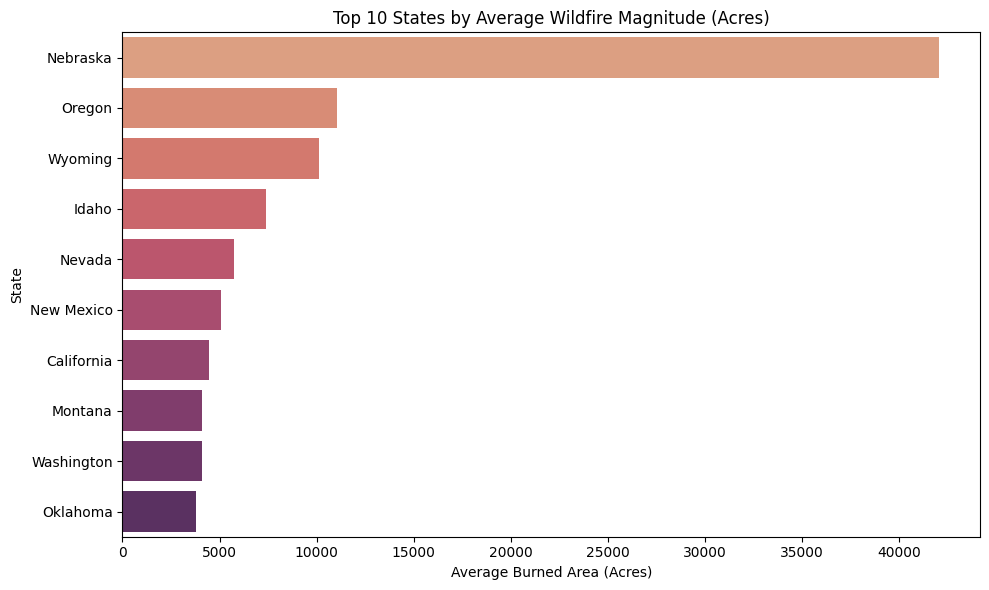

In [79]:
# create state row to the EONET dataframe
us_df = df[
    (df["latitude"] >= 24) & (df["latitude"] <= 50) &
    (df["longitude"] >= -125) & (df["longitude"] <= -66)
].copy()

coords = list(zip(us_df["latitude"], us_df["longitude"]))
geo_results = rg.search(coords)

us_df["state"] = [r["admin1"] for r in geo_results]

# magnitude by continent based on EONET data
eonet_state_magnitude = (
    us_df[
        (us_df["category_title"] == "Wildfires") &
        (us_df["magnitude_value"].notna())
    ]
    .groupby("state")["magnitude_value"]
    .mean()
    .reset_index(name="avg_magnitude_acres")
    .sort_values("avg_magnitude_acres", ascending=False)
)

print(eonet_state_magnitude.head(10))

# Top 10 states by average wildfire magnitude
state_magnitude_top = (
    eonet_state_magnitude
    .sort_values("avg_magnitude_acres", ascending=False)
    .head(10)
)

plt.figure(figsize=(10, 6))

ax = sns.barplot(
    data=state_magnitude_top,
    y="state",
    x="avg_magnitude_acres",
    hue="state",
    palette="flare",
    legend=False
)

plt.title("Top 10 States by Average Wildfire Magnitude (Acres)")
plt.xlabel("Average Burned Area (Acres)")
plt.ylabel("State")

plt.tight_layout()
plt.show()

### 2.2 Finding based on FIRMS (Fire intensity by FPR)

The results indicate that wildfire intensity, as measured by average FRP, varies notably across states, with **Utah** exhibiting substantially higher fire intensity than others. With an average FRP of about 70.74, Utah stands out clearly from the rest.  Overall, the distribution suggests that fire intensity is **unevenly distributed**.

              state    avg_frp
54             Utah  70.741207
50     South Dakota  36.028750
1           Arizona  18.494516
20           Kansas  13.733910
3   Baja California  13.681000
25    Massachusetts  13.505000
16            Idaho  12.345500
55         Virginia  12.150430
48           Sonora  11.376750
19             Iowa  11.338122


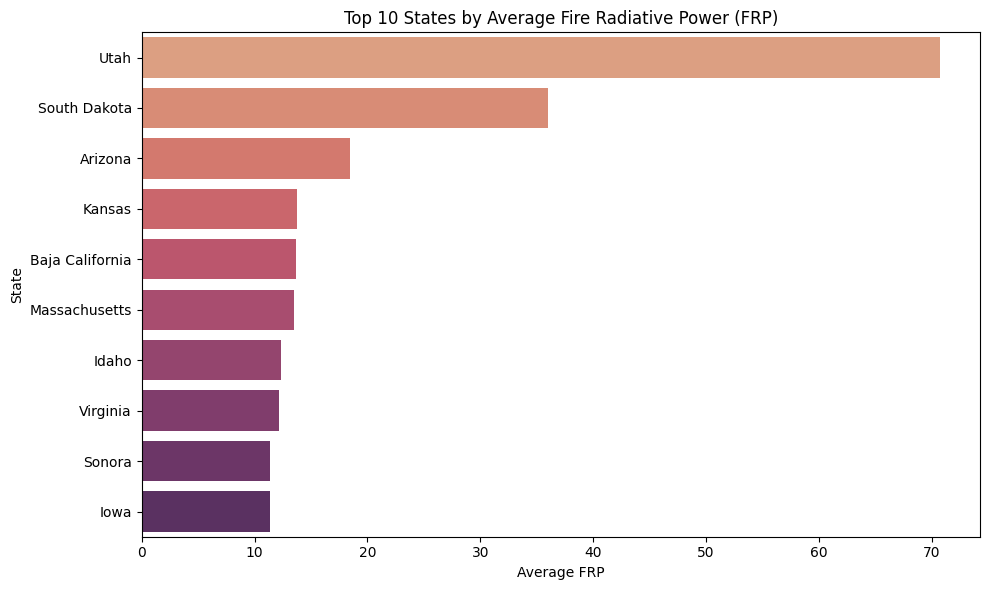

In [80]:
# filter FIRMS to the U.S.
firms_us = firms_df[
    (firms_df["latitude"] >= 24) & (firms_df["latitude"] <= 50) &
    (firms_df["longitude"] >= -125) & (firms_df["longitude"] <= -66)
].copy()

# Add states
coords = list(zip(firms_us["latitude"], firms_us["longitude"]))
geo_results = rg.search(coords)

firms_us["state"] = [r["admin1"] for r in geo_results]

# compute FPR
firms_state_frp = (
    firms_us
    .groupby("state")["frp"]
    .mean()
    .reset_index(name="avg_frp")
    .sort_values("avg_frp", ascending=False)
)

print(firms_state_frp.head(10))

# plot the result
state_frp_top = firms_state_frp.sort_values("avg_frp", ascending=False).head(10)

plt.figure(figsize=(10, 6))

sns.barplot(
    data=state_frp_top,
    y="state",
    x="avg_frp",
    hue="state",
    palette="flare",
    legend=False
)

plt.title("Top 10 States by Average Fire Radiative Power (FRP)")
plt.xlabel("Average FRP")
plt.ylabel("State")

plt.tight_layout()
plt.show()

### 2.3 Associate EONET and FIRMS (Magnitude vs. Intensity)

By combining EONET and FIRMS, a more comprehensive picture of wildfire behavior emerges. While EONET captures the total burned area of wildfire events and FIRMS measures instantaneous fire intensity, their comparison at the state level reveals a generally consistent pattern: **regions with larger average burned areas often also exhibit higher fire intensity.** This relationship is particularly evident in western U.S. states, where both magnitude and FRP are elevated.

However, the relationship is not perfectly linear, reflecting differences in fire behavior, environmental conditions, and data structure between the two sources.

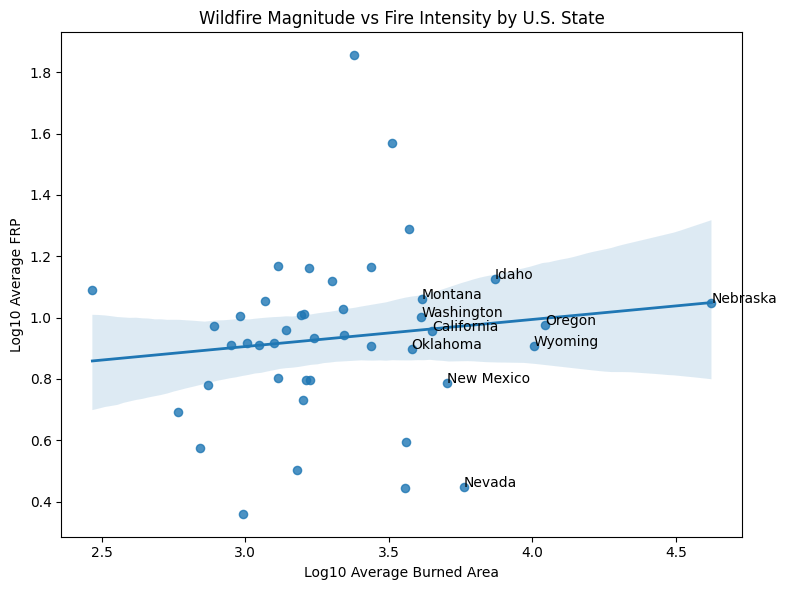

In [102]:
# merge
state_intensity = pd.merge(
    eonet_state_magnitude,
    firms_state_frp,
    on="state",
    how="inner"
).copy()

# optional: log-transform both variables
state_intensity["log_avg_magnitude"] = np.log10(state_intensity["avg_magnitude_acres"])
state_intensity["log_avg_frp"] = np.log10(state_intensity["avg_frp"] + 1)
# +1 avoids problems if FRP is very close to 0

plt.figure(figsize=(8,6))

sns.regplot(
    data=state_intensity,
    x="log_avg_magnitude",
    y="log_avg_frp",
    scatter_kws={"s": 35},
    line_kws={"linewidth": 2}
)

plt.title("Wildfire Magnitude vs Fire Intensity by U.S. State")
plt.xlabel("Log10 Average Burned Area")
plt.ylabel("Log10 Average FRP")

# label only a few unusual states
top_states = state_intensity.sort_values("avg_magnitude_acres", ascending=False).head(10)

for _, row in top_states.iterrows():
    plt.text(
        row["log_avg_magnitude"],
        row["log_avg_frp"],
        row["state"],
        fontsize=10
    )

plt.tight_layout()
plt.show()

### 3. What is the seasonal pattern of wildfire?

The results demonstrate that wildfire activity in the United States is **strongly seasonal**, with **late summer and early fall** representing the most active and intense period. The consistency between EONET and FIRMS reinforces the reliability of this pattern, while the addition of FRP highlights that **seasonal factors influence both the occurrence and intensity** of wildfires.





### 3.1 Capture Monthly trend from EONET (event by month)

According to 1.3, the trend of wildfire is: in the **Northern Hemisphere**, wildfire events tend to **rise during the middle of the year and peak in the warmer months**.
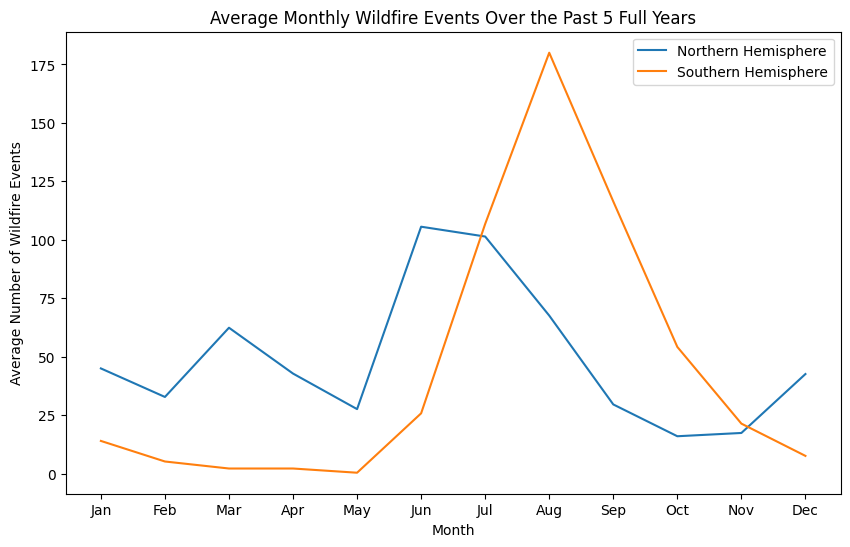

In [82]:
eonet_monthly = (
    df[df["category_title"] == "Wildfires"]
    .groupby("month")
    .size()
    .reset_index(name="eonet_fire_count")
)

### 3.2 Capture Monthly trend from FIRMS (FPR by month)

In [83]:
five_yrs_data = pd.read_csv('/content/fire.csv')
firms_df = five_yrs_data.copy()

# convert date
firms_df["acq_date"] = pd.to_datetime(firms_df["acq_date"], errors="coerce")

# drop bad rows
firms_df = firms_df.dropna(subset=["acq_date", "frp", "latitude", "longitude"])

# month and year variable
firms_df["year"] = firms_df["acq_date"].dt.year
firms_df["month"] = firms_df["acq_date"].dt.month

In [84]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [85]:
firms_monthly = (
    firms_df
    .groupby("month")
    .agg(
        firms_fire_count=("frp", "count"),
        firms_avg_frp=("frp", "mean")
    )
    .reset_index()
)

### 3.3 Combine EONET and FIRMS

Both EONET and FIRMS datasets exhibit **similar seasonal patterns**, with wildfire activity peaking during summer months. This consistency suggests that EONET event reporting aligns well with satellite-based fire detections.

Their strong alignment suggests that **both frequency and intensity of wildfires are driven by similar seasonal factors**.

In [86]:
monthly_combined = pd.merge(
    eonet_monthly,
    firms_monthly,
    on="month",
    how="inner"
)

# month names
monthly_combined["month_name"] = pd.to_datetime(
    monthly_combined["month"], format="%m"
).dt.strftime("%b")

print(monthly_combined)

# normalize scale
monthly_combined["eonet_norm"] = (
    monthly_combined["eonet_fire_count"] /
    monthly_combined["eonet_fire_count"].max()
)

monthly_combined["firms_norm"] = (
    monthly_combined["firms_fire_count"] /
    monthly_combined["firms_fire_count"].max()
)

    month  eonet_fire_count  firms_fire_count  firms_avg_frp month_name
0       1               390            107286       9.249397        Jan
1       2               502            155766       8.676726        Feb
2       3               545            259178       8.649354        Mar
3       4               225            237851       9.133713        Apr
4       5               140            168985       9.532117        May
5       6               657            262741      12.724690        Jun
6       7              1041            341873      14.746192        Jul
7       8              1238            498183      15.093312        Aug
8       9               730            596147      15.699355        Sep
9      10               351            296418      11.324983        Oct
10     11               194            172909       8.019486        Nov
11     12               251            114786       9.828764        Dec


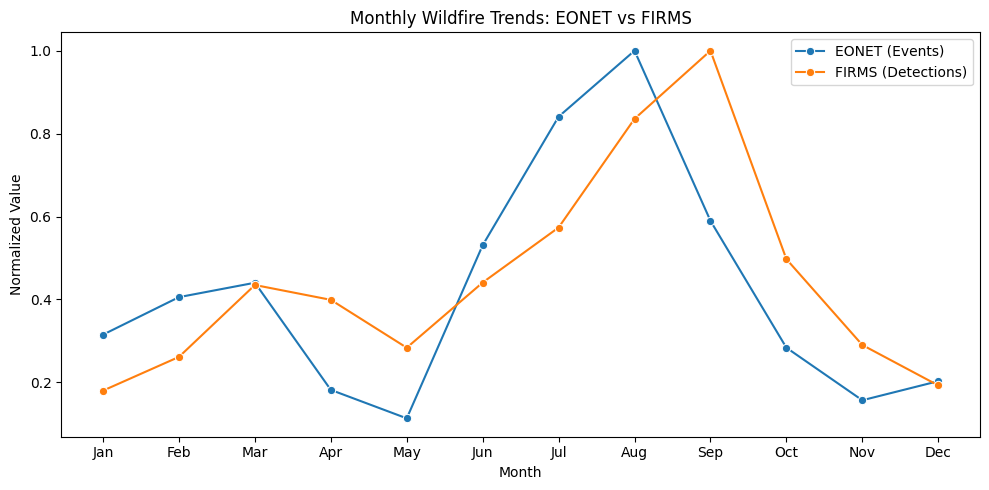

In [87]:
plt.figure(figsize=(10,5))

sns.lineplot(
    data=monthly_combined,
    x="month_name",
    y="eonet_norm",
    marker="o",
    label="EONET (Events)"
)

sns.lineplot(
    data=monthly_combined,
    x="month_name",
    y="firms_norm",
    marker="o",
    label="FIRMS (Detections)"
)

plt.title("Monthly Wildfire Trends: EONET vs FIRMS")
plt.xlabel("Month")
plt.ylabel("Normalized Value")

plt.legend()
plt.tight_layout()
plt.show()

In [88]:
corr = monthly_combined["eonet_fire_count"].corr(
    monthly_combined["firms_fire_count"]
)

print("Correlation between EONET and FIRMS:", corr)

Correlation between EONET and FIRMS: 0.7168620097394758


### 3.4 Seasonal Factor: Temperature

The results show a clear **seasonal temperature pattern**, with temperatures rising from winter to a peak in July–August and then declining toward the end of the year. This pattern closely aligns with wildfire activity, as indicated by the **strong positive correlations between temperature and both fire frequency (0.73) and fire intensity (FRP, 0.81)**. The scatter plot further confirms this relationship, showing that **higher temperatures are associated with substantially higher wildfire counts**. Overall, the findings suggest that temperature is a key driver of both the occurrence and severity of wildfires, reinforcing the idea that seasonal climatic conditions play a crucial role in shaping wildfire dynamics.

In [89]:
import requests
import pandas as pd

# US central coordinate
latitude = 39.5
longitude = -98.35

url = (
    "https://archive-api.open-meteo.com/v1/archive?"
    f"latitude={latitude}&longitude={longitude}"
    "&start_date=2020-01-01"
    "&end_date=2025-12-31"
    "&daily=temperature_2m_mean"
    "&timezone=auto"
)

response = requests.get(url)
data = response.json()

In [90]:
temp_df = pd.DataFrame({
    "date": data["daily"]["time"],
    "temp": data["daily"]["temperature_2m_mean"]
})

temp_df["date"] = pd.to_datetime(temp_df["date"])

temp_df["year"] = temp_df["date"].dt.year
temp_df["month"] = temp_df["date"].dt.month

In [91]:
# convert to monthly average
monthly_temp = (
    temp_df
    .groupby(["year", "month"])["temp"]
    .mean()
    .reset_index(name="avg_temp")
)

# match to wildfire date structure
monthly_temp_avg = (
    monthly_temp
    .groupby("month")["avg_temp"]
    .mean()
    .reset_index()
)

monthly_temp_avg["month_name"] = pd.to_datetime(
    monthly_temp_avg["month"], format="%m"
).dt.strftime("%b")

print(monthly_temp_avg)

# merge with monthly combined dataset
monthly_full = pd.merge(
    monthly_combined,
    monthly_temp_avg,
    on="month",
    how="inner"
)

# corr
print("Temp vs Fire Count:",
      monthly_full["avg_temp"].corr(monthly_full["firms_fire_count"]))

print("Temp vs FRP:",
      monthly_full["avg_temp"].corr(monthly_full["firms_avg_frp"]))

    month   avg_temp month_name
0       1  -1.913441        Jan
1       2  -0.198399        Feb
2       3   7.600000        Mar
3       4  13.072222        Apr
4       5  18.216667        May
5       6  25.525556        Jun
6       7  26.737634        Jul
7       8  26.029570        Aug
8       9  22.092222        Sep
9      10  14.973656        Oct
10     11   7.601111        Nov
11     12   1.868280        Dec
Temp vs Fire Count: 0.7286484361557474
Temp vs FRP: 0.8092894596244271


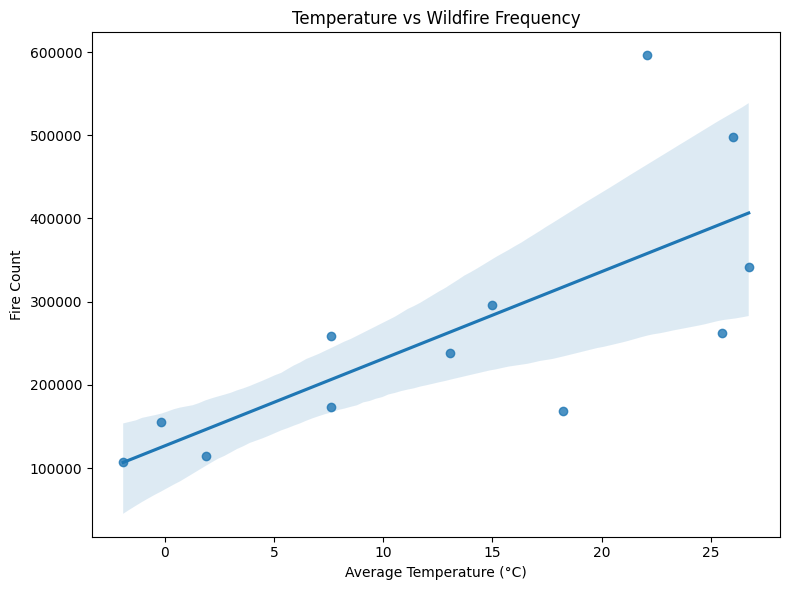

In [92]:
# plot the result
plt.figure(figsize=(8,6))

sns.regplot(
    data=monthly_full,
    x="avg_temp",
    y="firms_fire_count"
)

plt.title("Temperature vs Wildfire Frequency")
plt.xlabel("Average Temperature (°C)")
plt.ylabel("Fire Count")

plt.tight_layout()
plt.show()

## IV. Additional Analysis: Using EONET to explore Volcanic Activities

### 4.1 Volcano Spatial Distribution
Volcanic activities are mainly concentrated along the **Pacific Ring of Fire**, especially the **western coasts of North and South America**, **East and Southeast Asia**, and **Oceania**. Additional smaller clusters appear in the **Mediterranean region**, **Iceland**, and **East Africa**.

In [98]:
import folium as fm

volcano_data = df[df["category_title"] == "Volcanoes"].copy()
volcano_data = volcano_data.dropna(subset=["latitude", "longitude"])

volcano_world_map = fm.Map(location=[20, 0], zoom_start=2)

for row_index, volcano_record in volcano_data.iterrows():
    fm.CircleMarker(
        location=[volcano_record["latitude"], volcano_record["longitude"]],
        radius=2,
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"Event: {volcano_record['title']}<br>"
            f"Date: {volcano_record['geometry_date']}<br>"
            f"Magnitude: {volcano_record['magnitude_value']} {volcano_record['magnitude_unit']}"
        )
    ).add_to(volcano_world_map)

volcano_world_map

###4.2 Volcano Seasonality by Hemisphere
Similar to wildfire, volcanic activity also demonstrates a clear **seasonal pattern** that varies across hemispheres. In the **Northern Hemisphere**, volcanic activities are more likely to happen from **June to August**, which is known as **summer**. While for the **Southern Hemisphere**, volcanic activities take place frequently from **November to January**, reflecting their **opposite** **seasonal cycle**. This contrast suggests that for volcanic activities, their occurrence is also strongly influenced by climate and seasonal dryness.

Overall, the comparison highlights that global volcano activity patterns are **seasonal**, but the timing of peak activity reverses between the two hemispheres.

In [94]:

if "latitude" in volcano_data.columns:
    volcano_data["latitude"] = volcano_data["latitude"]
else:
    volcano_data["latitude"] = volcano_data["coordinates"].apply(lambda x: x[1] if isinstance(x, (list, tuple)) and len(x) >= 2 else None)

# group by north and south hemispheres
volcano_data["hemisphere"] = volcano_data["latitude"].apply(
    lambda lat: "Northern Hemisphere" if pd.notna(lat) and lat >= 0 else
                "Southern Hemisphere" if pd.notna(lat) else None
)

# extract months and count volcanoes by months
volcano_data["geometry_date"] = pd.to_datetime(volcano_data["geometry_date"], errors="coerce")
volcano_data["month"] = volcano_data["geometry_date"].dt.month

volcano_month_counts = (
    volcano_data
    .dropna(subset=["month", "hemisphere"])
    .groupby(["month", "hemisphere"])
    .size()
    .unstack(fill_value=0)
)

volcano_month_counts = volcano_month_counts.reindex(range(1, 13), fill_value=0)

# determine format
volcano_month_counts = volcano_month_counts.reset_index()
volcano_month_counts["month_name"] = volcano_month_counts["month"].map({
    1: "Jan", 2: "Feb", 3: "Mar", 4: "Apr",
    5: "May", 6: "Jun", 7: "Jul", 8: "Aug",
    9: "Sep", 10: "Oct", 11: "Nov", 12: "Dec"
})
volcano_month_table = volcano_month_counts[[
    "month", "month_name", "Northern Hemisphere", "Southern Hemisphere"
]]

# deal with missing data
both_zero = (
    (volcano_month_table["Northern Hemisphere"] == 0) &
    (volcano_month_table["Southern Hemisphere"] == 0)
)

volcano_month_table.loc[both_zero, ["Northern Hemisphere", "Southern Hemisphere"]] = None


volcano_month_table

hemisphere,month,month_name,Northern Hemisphere,Southern Hemisphere
0,1,Jan,3.0,3.0
1,2,Feb,0.0,1.0
2,3,Mar,1.0,1.0
3,4,Apr,2.0,0.0
4,5,May,NaN,NaN
5,6,Jun,4.0,0.0
6,7,Jul,3.0,1.0
7,8,Aug,5.0,3.0
8,9,Sep,2.0,0.0
9,10,Oct,1.0,0.0


## V. Interactive Take Aways

*Note: This part should be run in a local terminal with [streamlit](https://streamlit.io/) downloaded. A broser window contains short takeaways in form of a quiz would pop up if it works.

In [95]:
!pip install streamlit

In [103]:
import streamlit as st

st.title("Wildfire Insights Quiz")

score = 0

q1 = st.radio(
    "Which state had the highest average wildfire magnitude in Earth Observatory Natural Event Tracker (EONET)?",
    ["California", "Nebraska", "Oregon", "Montana"],
    key="q1"
)

if st.button("Check Answer for Q1"):
    if q1 == "Nebraska":
        st.success("Correct! Nebraska had the highest average burned area in the EONET state analysis.")
    else:
        st.error("Not quite. The correct answer is Nebraska.")

q2 = st.radio(
    "Did wildfire detections occur more often during the day or at night in Fire Information for Resource Management System (FIRMS)?",
    ["Daytime", "Nighttime"],
    key="q2"
)

if st.button("Check Answer for Q2"):
    if q2 == "Daytime":
        st.success("Correct! Around 83% of detections were during the daytime.")
    else:
        st.error("Not quite. The correct answer is Daytime.")

q3 = st.radio(
    "Which relationship was stronger in your analysis?",
    ["Temperature vs Fire Count", "Temperature vs Fire Radiative Power (FRP)"],
    key="q3"
)

if st.button("Check Answer for Q3"):
    if q3 == "Temperature vs FRP":
        st.success("Correct! Temperature had a stronger correlation with FRP than with fire count.")
    else:
        st.error("Not quite. Temperature vs FRP was stronger.")

q4 = st.radio(
    "Wildfire take place the most frequently in which 2 months?",
    ["Jan-Feb", "May-Jun", "Jul-Aug","Nov-Dec"],
    key="q4"
)

if st.button("Check Answer for Q4"):
    if q4 == "Jul-Aug":
        st.success("Correct! Most wildfire occur during July to August.")
    else:
        st.error("Not quite. Most wildfire occur during July to August.")

2026-03-27 05:33:40.645 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.647 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.650 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.655 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.656 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.660 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.661 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2026-03-27 05:33:40.667 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar